<a href="https://colab.research.google.com/github/zwe-htet-paing/notebooks/blob/main/Yolov5_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Train YOLOv5 instance segmentation model on a Custom Dataset with free gpu

The Yolo of object detection models grows ever stronger with the introduction of YOLOv5. In this post, we will walk through how you can train YOLOv5 segmentation model to detect your custom objects for your use case that with a free gpu.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download Custom YOLOv5 Object Detection Data
* Define YOLOv5 Model Configuration and Architecture
* Train a custom YOLOv5 Detector
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images




### **About**

You'll be able to train your own custom segmentation model within an hour . Happy learning! :) 


#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -r yolov5/requirements.txt  # install dependencies
%cd /content/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14483, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 14483 (delta 16), reused 28 (delta 9), pack-reused 14446
Receiving objects: 100% (14483/14483), 13.52 MiB | 8.49 MiB/s, done.
Resolving deltas: 100% (9987/9987), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 40.1 MB/s 
/content/yolov5


In [ ]:
import torch
from google.colab.patches import cv2_imshow  # for displaying images

# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="BaaTa0lskc7rcTYV9eTz")
project = rf.workspace("").project("handgun-bbwv8")
dataset = project.version(1).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 9.0 kB/s 
     |████████████████████████████████| 178 kB 54.0 MB/s 
     |████████████████████████████████| 67 kB 6.7 MB/s 
     |████████████████████████████████| 54 kB 2.4 MB/s 
     |████████████████████████████████| 138 kB 70.5 MB/s 
     |████████████████████████████████| 145 kB 77.9 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=b32448091ffc6792dbdf98f97228cf09b09dcac9eabee389302088962cd87b85
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certi

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to handgun_train-4 in yolov5pytorch:: 100%|██████████| 896/896 [00:00<00:00, 1744.82it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
#%cat {datasetlocation}/data.yaml
%cat /content/handgun_train-4/data.yaml

names:
- Handgun
nc: 1
roboflow:
  license: CC BY 4.0
  project: handgun_train
  url: https://universe.roboflow.com/afzal-shaikh-hktui/handgun_train/dataset/4
  version: 4
  workspace: afzal-shaikh-hktui
#test: ../test/images
train: /content/handgun_train-4/train/images
val: /content/handgun_train-4/valid/images


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/segment/yolov5s-seg.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.5  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
#!python segment/train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml  --weights yolov5s-seg  --cache
%%time
%cd /content/yolov5/
!python segment/train.py  --epochs 100 --data /content/handgun_train-4/data.yaml  --weights yolov5s-seg  --cfg yolov5s-seg.yaml --cache

/content/yolov5
segment/train: weights=yolov5s-seg, cfg=yolov5s-seg.yaml, data=/content/handgun_train-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train-seg, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, mask_ratio=4, no_overlap=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-226-gfde7758 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

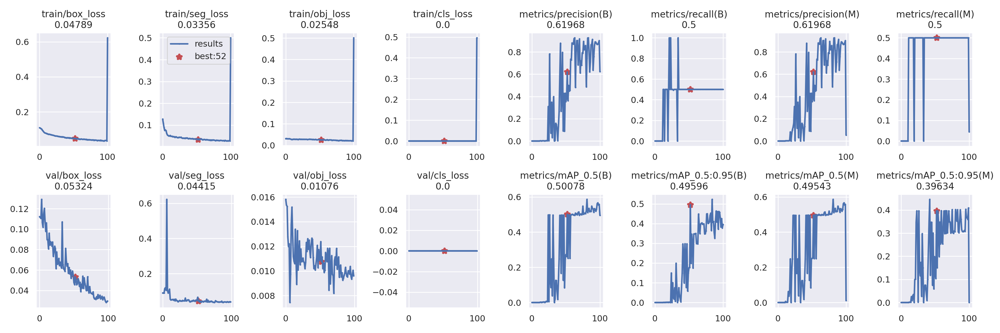

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from IPython.display import Image  # for displaying images

from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train-seg/exp3/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


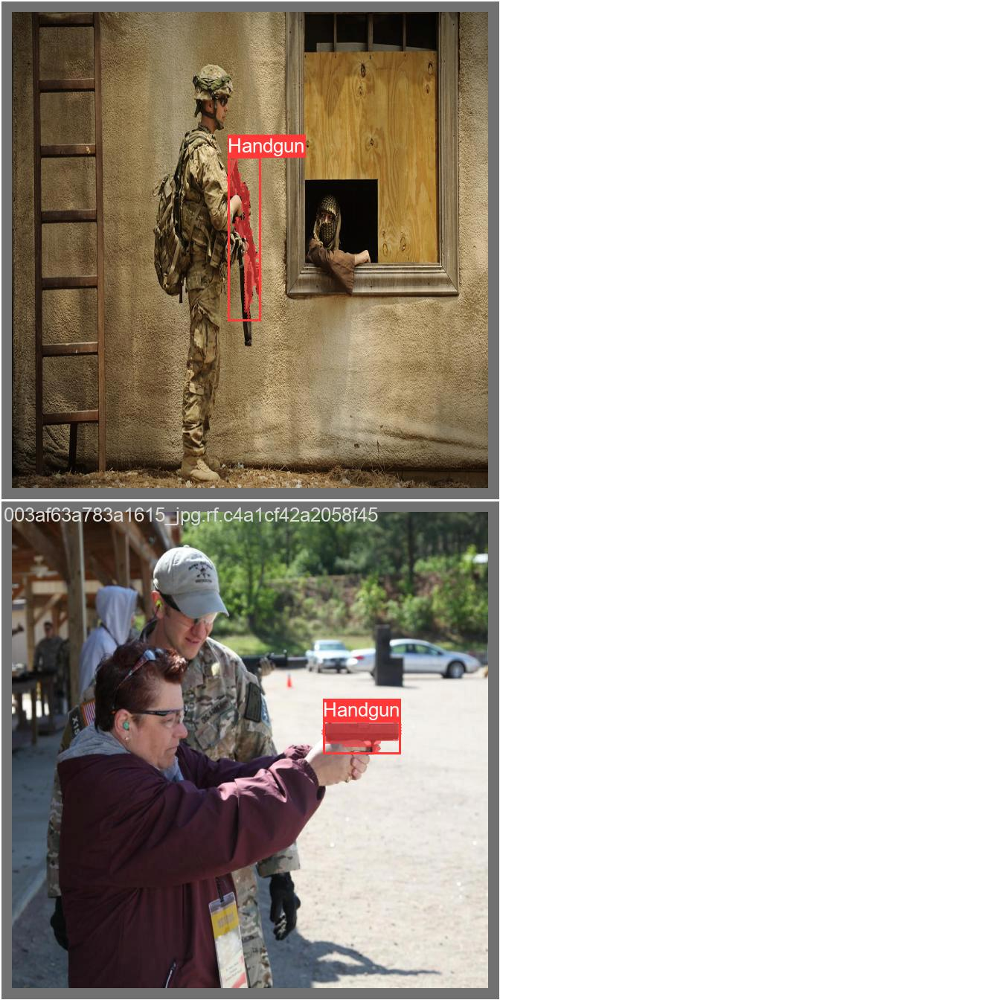

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train-seg/exp3/val_batch0_labels.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train-seg/


In [ ]:
%ls runs/train/yolov5s_results/weights

ls: cannot access 'runs/train/yolov5s_results/weights': No such file or directory


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python segment/predict.py --weights runs/train-seg/exp3/weights/best.pt --source /content/handgun_train-4/valid/images/003af63a783a1615_jpg.rf.c4a1cf42a2058f4589d7a8283b69eb02.jpg

/content/yolov5
segment/predict: weights=['runs/train-seg/exp3/weights/best.pt'], source=/content/handgun_train-4/valid/images/003af63a783a1615_jpg.rf.c4a1cf42a2058f4589d7a8283b69eb02.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1, retina_masks=False
YOLOv5 🚀 v6.2-226-gfde7758 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s-seg summary: 165 layers, 7398422 parameters, 0 gradients, 25.7 GFLOPs
image 1/1 /content/handgun_train-4/valid/images/003af63a783a1615_jpg.rf.c4a1cf42a2058f4589d7a8283b69eb02.jpg: 640x640 (no detections), 15.9ms
Speed: 0.6ms pre-process, 15.9ms inference, 0.4ms NMS per image 

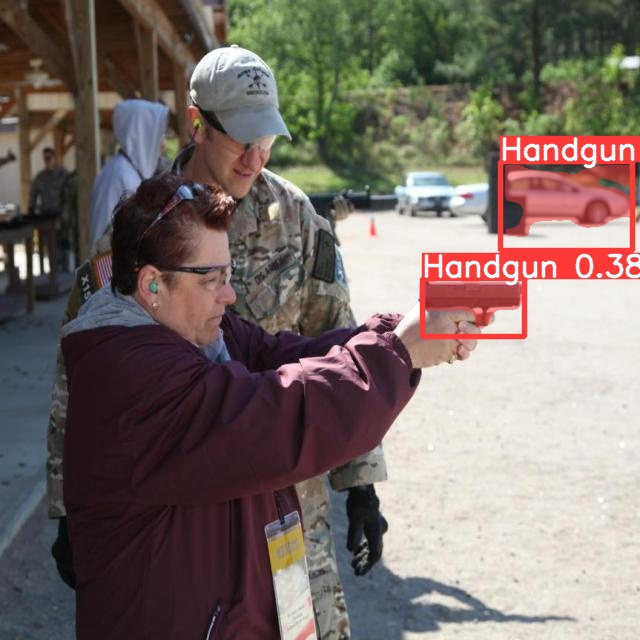

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from google.colab.patches import cv2_imshow  
for imageName in glob.glob('/content/yolov5/runs/predict-seg/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Congrats!

Hope you enjoyed this!

